In [1]:
import json
from typing import List, Tuple

import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from rich import print
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
from PIL import Image
from clip import tokenize
from transformers import CLIPVisionModelWithProjection, CLIPTextModelWithProjection, CLIPImageProcessor

from src.data_utils import FashionIQDataset
from src.utils import extract_index_features_clip, device, extract_index_features_with_text_captions_clip
from src.validate_clip import generate_fiq_val_predictions

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Modify the function for calculation in different alpha values</div>

# <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform alpha search for the best alpha value after the search and index were encoded</div>

In [2]:
def compute_fiq_val_metrics_text_image_modified(
    relative_val_dataset: FashionIQDataset,
    clip_text_encoder: torch.nn.Module,
    clip_tokenizer,
    multiple_text_index_features: List[torch.tensor],
    multiple_text_index_names: List[List[str]],
    image_index_features: torch.tensor,
    image_index_names: List[str],
    combining_function: callable
) -> pd.DataFrame:
    """
    Compute validation metrics on FashionIQ dataset combining text and image distances.

    :param relative_val_dataset: FashionIQ validation dataset in relative mode
    :param clip_text_encoder: CLIP text encoder
    :param clip_tokenizer: CLIP tokenizer
    :param multiple_text_index_features: validation index features from text
    :param multiple_text_index_names: validation index names from text
    :param image_index_features: validation image index features
    :param image_index_names: validation image index names
    :param combining_function: function that combines features
    :return: the computed validation metrics
    """
    all_text_distances = []
    results = []
    alphas = np.arange(0, 1.05, 0.05)
    target_names = None

    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_text_index_features, multiple_text_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, target_names = generate_fiq_val_predictions(
            clip_text_encoder,
            clip_tokenizer,
            relative_val_dataset,
            combining_function,
            text_names,
            text_features
        )
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    # Normalize and compute distances for image features if available
    if image_index_features is not None and len(image_index_features) > 0:
        predicted_image_features, _ = generate_fiq_val_predictions(
            clip_text_encoder,
            clip_tokenizer,
            relative_val_dataset,
            combining_function, image_index_names,
            image_index_features
        )

        # Normalize and compute distances
        image_index_features = F.normalize(image_index_features, dim=-1).float()
        image_distances = 1 - predicted_image_features @ image_index_features.T
    else:
        image_distances = torch.zeros_like(all_text_distances[0])

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)

    # Iterating over alpha values
    for alpha in alphas:
        merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances
        sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
        sorted_index_names = np.array(image_index_names if image_index_names else multiple_text_index_names[0])[
            sorted_indices]
        labels = torch.tensor(
            sorted_index_names == np.repeat(np.array(target_names),
                                            len(image_index_names if image_index_names else multiple_text_index_names[
                                                0])).reshape(len(target_names), -1))
        assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
        recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
        recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100
        results.append({"alpha": alpha, "recall_at10": recall_at10, "recall_at50": recall_at50})

    return pd.DataFrame(results)

In [3]:
def fashioniq_val_retrieval_text_image_modified(
    dress_type: str,
    combining_function: callable,
    clip_text_encoder: torch.nn.Module,
    clip_img_encoder: torch.nn.Module,
    clip_tokenizer,
    text_captions: List[dict],
    preprocess: callable):
    """
    Perform retrieval on FashionIQ validation set computing the metrics. To combine the features the `combining_function`
    is used
    :param dress_type: FashionIQ category on which perform the retrieval
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined  features
    :param clip_text_encoder: CLIP text model
    :param clip_img_encoder: CLIP image model
    :param clip_tokenizer: CLIP tokenizer
    :param text_captions: text captions for the FashionIQ dataset
    :param preprocess: preprocess pipeline
    """

    clip_text_encoder = clip_text_encoder.float().eval()
    clip_img_encoder = clip_img_encoder.float().eval()

    # Define the validation datasets and extract the index features
    classic_val_dataset = FashionIQDataset('val', [dress_type], 'classic', preprocess)

    multiple_index_features, multiple_index_names = [], []

    for i in range(3):
        index_features, index_names, _ = extract_index_features_with_text_captions_clip(
            classic_val_dataset,
            clip_text_encoder,
            clip_tokenizer,
            text_captions,
            i + 1
        )
        multiple_index_features.append(index_features)
        multiple_index_names.append(index_names)

    image_index_features, image_index_names = extract_index_features_clip(
        classic_val_dataset, clip_img_encoder
    )

    relative_val_dataset = FashionIQDataset('val', [dress_type], 'relative', preprocess)

    return compute_fiq_val_metrics_text_image_modified(
        relative_val_dataset,
        clip_text_encoder,
        clip_tokenizer,
        multiple_index_features,
        multiple_index_names,
        image_index_features,
        image_index_names,
        combining_function
    )

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the CLIP model and the Combiner</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [4]:
CLIP_NAME = 'Geonmo/CLIP-Giga-config-fixed'

In [5]:
clip_text_encoder = CLIPTextModelWithProjection.from_pretrained(CLIP_NAME, torch_dtype=torch.float32)
clip_text_encoder = clip_text_encoder.float().to(device)

print("clip text encoder loaded.")
clip_text_encoder.eval()

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

clip text encoder loaded.

CLIPTextModelWithProjection(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 1280)
      (position_embedding): Embedding(77, 1280)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-31): 32 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=1280, out_features=1280, bias=True)
            (v_proj): Linear(in_features=1280, out_features=1280, bias=True)
            (q_proj): Linear(in_features=1280, out_features=1280, bias=True)
            (out_proj): Linear(in_features=1280, out_features=1280, bias=True)
          )
          (layer_norm1): LayerNorm((1280,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=1280, out_features=5120, bias=True)
            (fc2): Linear(in_features=5120, out_features=1280, bias=True)
          )
          (layer_norm2): La

In [6]:
clip_img_encoder = CLIPVisionModelWithProjection.from_pretrained(CLIP_NAME, torch_dtype=torch.float32)

clip_img_encoder = clip_img_encoder.float().to(device)
print("clip img encoder loaded.")
clip_img_encoder = clip_img_encoder.eval()

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

clip img encoder loaded.

In [7]:
print('CLIP preprocess pipeline is used')
preprocess = CLIPImageProcessor(
    crop_size={'height': 224, 'width': 224},
    do_center_crop=True,
    do_convert_rgb=True,
    do_normalize=True,
    do_rescale=True,
    do_resize=True,
    image_mean=[0.48145466, 0.4578275, 0.40821073],
    image_std=[0.26862954, 0.26130258, 0.27577711],
    resample=3,
    size={'shortest_edge': 224},
)

CLIP preprocess pipeline is used

In [8]:
clip_tokenizer = tokenize

In [9]:
def element_wise_sum_original(image_features: torch.tensor, text_features: torch.tensor) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize(image_features + text_features, dim=-1)

In [10]:
combining_function_original = element_wise_sum_original

In [11]:
def element_wise_sum(image_features: torch.tensor, text_features: torch.tensor, beta=0.65) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :param beta: weight for text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize((1 - beta) * image_features + beta * text_features, dim=-1)

In [12]:
combining_function = lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=0.65)

In [13]:
def get_combing_function_with_beta(beta: float):
    return lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=beta)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the FashionIQ dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions and perform retrieval on the FashionIQ dataset</div>

In [14]:
with open('../fashionIQ_dataset/labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)
    
total_recall_list: List[List[pd.DataFrame]] = []

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to convert the list of DataFrames to a single DataFrame with a pivot table structure</div>

In [15]:
def convert_to_pivot(data: List[pd.DataFrame]) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Convert a list of DataFrames to a single DataFrame with a pivot table structure.
    :param data: list of DataFrames
    :param column_name: name of the column to use as the index
    :return: a single DataFrame with a pivot table structure
    """
    concatenated_data = []
    betas = np.arange(0, 1.05, 0.05)

    # Concatenate dataframes for all betas and add beta_index, beta_df in enumerate(data):
    for beta_index, beta_df in enumerate(data):
        beta_df['beta'] = round(betas[beta_index], 2)  # Round to two decimal places
        concatenated_data.append(beta_df)

    # Create one dataframe per category
    category_df = pd.concat(concatenated_data, ignore_index=True)
    
    # Create pivot tables for recall@10 and recall@50
    recall_at10 = category_df.pivot_table(index='alpha', columns='beta', values='recall_at10')
    recall_at50 = category_df.pivot_table(index='alpha', columns='beta', values='recall_at50')
    
    return recall_at10, recall_at50

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the shirt category</div>

In [16]:
grid_search_betas = np.arange(0, 1.05, 0.05)
shirt_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    shirt_recall = fashioniq_val_retrieval_text_image_modified(
        'shirt',
        get_combing_function_with_beta(beta),
        clip_text_encoder,
        clip_img_encoder,
        clip_tokenizer,
        text_captions,
        preprocess
    )
    print(f"Shirt recall at 10 for beta={beta}: {shirt_recall['recall_at10'].max()}")
    print(f"Shirt recall at 50 for beta={beta}: {shirt_recall['recall_at50'].max()}")
    
    shirt_recall_list.append(shirt_recall)
    
shirt_recall_at10, shirt_recall_at50 = convert_to_pivot(shirt_recall_list)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:12<00:00,  1.87s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 21:45:45.546502] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.79it/s]


[2024-06-09 21:45:58.907791] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.71it/s]


[2024-06-09 21:46:12.498194] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.73it/s]


[2024-06-09 21:46:26.037311] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.64it/s]


Shirt recall at 10 for beta=0.0: 15.161924064159393

Shirt recall at 50 for beta=0.0: 27.379783987998962

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:11<00:00,  1.86s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 21:55:02.573915] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.81it/s]


[2024-06-09 21:55:15.884484] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.75it/s]


[2024-06-09 21:55:29.380222] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.64it/s]


[2024-06-09 21:55:43.192616] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.71it/s]


Shirt recall at 10 for beta=0.05: 15.652599930763245

Shirt recall at 50 for beta=0.05: 28.066733479499817

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:08<00:00,  1.85s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 22:04:15.837054] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.85it/s]


[2024-06-09 22:04:29.045195] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.77it/s]


[2024-06-09 22:04:42.474472] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.77it/s]


[2024-06-09 22:04:55.887974] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.77it/s]


Shirt recall at 10 for beta=0.1: 16.143277287483215

Shirt recall at 50 for beta=0.1: 29.1952908039093

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:08<00:00,  1.85s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 22:13:28.314728] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.90it/s]


[2024-06-09 22:13:41.467944] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.79it/s]


[2024-06-09 22:13:54.830921] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.79it/s]


[2024-06-09 22:14:08.201450] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.78it/s]


Shirt recall at 10 for beta=0.15000000000000002: 16.633954644203186

Shirt recall at 50 for beta=0.15000000000000002: 30.52011728286743

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:10<00:00,  1.86s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 22:22:43.406988] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.81it/s]


[2024-06-09 22:22:56.709027] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.74it/s]


[2024-06-09 22:23:10.223968] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.74it/s]


[2024-06-09 22:23:23.733766] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.74it/s]


Shirt recall at 10 for beta=0.2: 17.419038712978363

Shirt recall at 50 for beta=0.2: 31.74681067466736

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:11<00:00,  1.87s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 22:32:00.003688] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.81it/s]


[2024-06-09 22:32:13.306066] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.73it/s]


[2024-06-09 22:32:26.839642] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.73it/s]


[2024-06-09 22:32:40.365433] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.73it/s]


Shirt recall at 10 for beta=0.25: 18.400391936302185

Shirt recall at 50 for beta=0.25: 33.12070667743683

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:10<00:00,  1.86s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 22:41:14.688998] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.79it/s]


[2024-06-09 22:41:28.053059] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.66it/s]


[2024-06-09 22:41:41.791191] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.70it/s]


[2024-06-09 22:41:55.408733] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.65it/s]


Shirt recall at 10 for beta=0.30000000000000004: 19.872424006462097

Shirt recall at 50 for beta=0.30000000000000004: 34.98528003692627

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:12<00:00,  1.87s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 22:50:34.555024] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.83it/s]


[2024-06-09 22:50:47.807172] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.75it/s]


[2024-06-09 22:51:01.297487] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.76it/s]


[2024-06-09 22:51:14.754731] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.76it/s]


Shirt recall at 10 for beta=0.35000000000000003: 21.491658687591553

Shirt recall at 50 for beta=0.35000000000000003: 37.19332814216614

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:08<00:00,  1.85s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 22:59:48.322230] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.84it/s]


[2024-06-09 23:00:01.551330] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.75it/s]


[2024-06-09 23:00:15.044617] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.75it/s]


[2024-06-09 23:00:28.518511] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.76it/s]


Shirt recall at 10 for beta=0.4: 23.061825335025787

Shirt recall at 50 for beta=0.4: 39.254170656204224

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:12<00:00,  1.87s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 23:09:06.082038] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.79it/s]


[2024-06-09 23:09:19.453733] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.60it/s]


[2024-06-09 23:09:33.373843] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.71it/s]


[2024-06-09 23:09:46.970325] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.73it/s]


Shirt recall at 10 for beta=0.45: 24.730128049850464

Shirt recall at 50 for beta=0.45: 41.80569052696228

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:12<00:00,  1.87s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 23:18:26.472256] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.84it/s]


[2024-06-09 23:18:39.789167] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.73it/s]


[2024-06-09 23:18:53.330866] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.73it/s]


[2024-06-09 23:19:06.872381] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.73it/s]


Shirt recall at 10 for beta=0.5: 27.134445309638977

Shirt recall at 50 for beta=0.5: 44.60255205631256

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:14<00:00,  1.88s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 23:27:50.188978] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.82it/s]


[2024-06-09 23:28:03.481245] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.60it/s]


[2024-06-09 23:28:17.393075] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.60it/s]


[2024-06-09 23:28:31.302315] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.62it/s]


Shirt recall at 10 for beta=0.55: 29.833170771598816

Shirt recall at 50 for beta=0.55: 47.64474928379059

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:12<00:00,  1.87s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 23:37:09.651854] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.66it/s]


[2024-06-09 23:37:23.399916] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.61it/s]


[2024-06-09 23:37:37.296102] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:14<00:00,  4.56it/s]


[2024-06-09 23:37:51.348708] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:14<00:00,  4.57it/s]


Shirt recall at 10 for beta=0.6000000000000001: 32.87536799907684

Shirt recall at 50 for beta=0.6000000000000001: 50.196272134780884

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:23<00:00,  1.93s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 23:46:42.207817] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.70it/s]


[2024-06-09 23:46:55.836950] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:14<00:00,  4.54it/s]


[2024-06-09 23:47:09.941896] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.61it/s]


[2024-06-09 23:47:23.839304] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:14<00:00,  4.56it/s]


Shirt recall at 10 for beta=0.65: 35.47595739364624

Shirt recall at 50 for beta=0.65: 52.25711464881897

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:15<00:00,  1.89s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 23:56:08.018303] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.63it/s]


[2024-06-09 23:56:21.855447] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.60it/s]


[2024-06-09 23:56:35.781914] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.72it/s]


[2024-06-09 23:56:49.338474] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.74it/s]


Shirt recall at 10 for beta=0.7000000000000001: 37.43866682052612

Shirt recall at 50 for beta=0.7000000000000001: 54.416096210479736

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:08<00:00,  1.85s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-10 00:05:21.633702] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.84it/s]


[2024-06-10 00:05:34.858251] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.76it/s]


[2024-06-10 00:05:48.311142] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.76it/s]


[2024-06-10 00:06:01.759886] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.77it/s]


Shirt recall at 10 for beta=0.75: 38.61629068851471

Shirt recall at 50 for beta=0.75: 56.42787218093872

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:10<00:00,  1.86s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-10 00:14:36.185440] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.83it/s]


[2024-06-10 00:14:49.451718] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.76it/s]


[2024-06-10 00:15:02.918138] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.75it/s]


[2024-06-10 00:15:16.386208] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.72it/s]


Shirt recall at 10 for beta=0.8: 37.978410720825195

Shirt recall at 50 for beta=0.8: 56.182533502578735

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:12<00:00,  1.87s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-10 00:23:52.698075] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.84it/s]


[2024-06-10 00:24:05.927855] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.79it/s]


[2024-06-10 00:24:19.395828] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.77it/s]


[2024-06-10 00:24:32.828430] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.78it/s]


Shirt recall at 10 for beta=0.8500000000000001: 36.3101065158844

Shirt recall at 50 for beta=0.8500000000000001: 54.21982407569885

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:08<00:00,  1.85s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-10 00:33:04.983136] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.86it/s]


[2024-06-10 00:33:18.154982] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.78it/s]


[2024-06-10 00:33:31.556954] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.78it/s]


[2024-06-10 00:33:44.948607] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.78it/s]


Shirt recall at 10 for beta=0.9: 32.973504066467285

Shirt recall at 50 for beta=0.9: 49.9509334564209

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:10<00:00,  1.86s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-10 00:42:19.558521] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.84it/s]


[2024-06-10 00:42:32.778373] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.77it/s]


[2024-06-10 00:42:46.214547] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.77it/s]


[2024-06-10 00:42:59.630108] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.77it/s]


Shirt recall at 10 for beta=0.9500000000000001: 29.04808521270752

Shirt recall at 50 for beta=0.9500000000000001: 44.847890734672546

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:08<00:00,  1.85s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-10 00:51:31.495055] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.86it/s]


[2024-06-10 00:51:44.672679] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.78it/s]


[2024-06-10 00:51:58.075371] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.78it/s]


[2024-06-10 00:52:11.475103] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.78it/s]


Shirt recall at 10 for beta=1.0: 25.662413239479065

Shirt recall at 50 for beta=1.0: 39.89205062389374

In [17]:
shirt_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,14.573111,15.112856,15.701668,16.388616,16.928361,17.713444,18.940137,20.117763,21.687929,23.650637,...,28.508341,31.108931,34.052992,36.359176,37.389597,37.095192,35.426888,31.746811,27.428851,23.699705
0.05,14.916585,15.407263,15.947007,16.339548,16.879293,18.204121,19.528949,20.363101,22.031404,24.043180,...,29.293424,31.697744,34.347400,36.604515,38.125613,37.978411,35.770363,32.728165,28.263003,24.190383
0.10,15.161924,15.652600,16.143277,16.633955,17.369971,17.958783,19.725221,20.902845,22.473013,24.631992,...,29.391560,32.041216,34.543669,36.849853,38.223749,37.733072,36.310107,32.973504,29.048085,24.975467
0.15,14.867517,15.456329,16.094211,16.486752,17.419039,18.302257,19.872424,21.246320,23.012757,24.631992,...,29.636899,32.237488,34.936211,37.340531,38.272816,37.782139,35.868499,32.433757,28.900883,25.662413
0.20,14.229637,14.965652,15.603533,16.486752,17.124632,18.400392,19.479883,21.491659,23.061825,24.631992,...,29.833171,32.875368,35.475957,37.340531,38.616291,37.291461,35.966635,32.237488,28.410205,25.269872
0.25,14.131501,14.720315,15.456329,16.290481,17.271835,17.909716,19.283612,21.050049,23.012757,24.730128,...,29.784101,32.826301,35.181549,37.340531,38.125613,37.046123,35.083416,31.795877,27.674189,25.220805
0.30,13.346419,14.033367,14.916585,15.358195,16.388616,17.369971,18.743867,20.412169,22.620216,24.484789,...,29.489696,32.531893,34.739941,37.438667,37.684003,36.064771,34.151128,30.765456,27.281648,25.171736
0.35,12.855741,13.640824,14.278704,15.014720,16.094211,16.830225,17.615309,19.479883,22.129539,24.239451,...,29.489696,32.237488,34.936211,36.457312,36.506379,35.426888,33.120707,29.882237,26.987243,24.681060
0.40,12.414131,13.150147,13.738960,14.573111,15.309127,16.143277,17.075564,18.842001,20.755643,23.258096,...,28.999019,31.501472,34.298331,35.377821,35.377821,34.200197,31.697744,28.606477,26.545632,24.337585


In [18]:
shirt_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,26.987243,27.870461,28.851816,30.029440,31.207067,32.826301,34.445536,36.408243,38.518155,40.088323,...,45.093229,46.957803,49.411187,52.011776,54.072618,55.201179,53.532875,49.263984,44.062808,38.518155
0.05,27.281648,27.968597,29.146221,30.520117,31.746811,32.875368,34.789008,36.604515,39.156035,40.628067,...,45.534837,47.890088,50.588810,53.042197,55.348378,55.888128,54.072618,49.852797,44.847891,39.303237
0.10,27.379784,28.066733,29.195291,30.471051,31.697744,33.120707,34.789008,36.849853,39.254171,41.020608,...,46.074584,48.577037,51.226693,53.483808,55.986261,56.182534,54.219824,49.950933,44.406280,39.892051
0.15,27.134445,28.066733,29.048085,30.421981,31.746811,32.973504,34.887144,37.095192,39.254171,41.413149,...,46.810597,49.067715,52.011776,53.974485,56.084394,55.937195,53.385675,49.509323,44.553483,39.892051
0.20,26.889107,27.821395,28.802747,30.029440,31.010795,32.728165,34.985280,37.046123,38.959765,41.609421,...,47.644749,49.754661,52.158982,54.416096,56.427872,55.691856,53.140336,49.411187,44.602552,39.842984
0.25,26.545632,26.938176,28.164867,29.538763,31.010795,32.482827,34.347400,37.193328,39.057899,41.609421,...,47.595683,49.950933,52.257115,54.268891,55.888128,54.759568,52.600586,49.018645,44.062808,39.744848
0.30,26.054955,26.790971,27.723259,29.048085,30.421981,31.844947,33.807653,36.457312,38.910696,41.805691,...,47.546613,50.196272,52.257115,54.023552,54.906774,53.925419,51.422966,47.939157,43.081453,39.401373
0.35,25.318941,26.202160,27.232581,28.459275,30.127576,31.403336,33.562315,35.868499,38.714427,41.413149,...,47.350344,49.214917,51.913643,53.483808,53.974485,52.845925,50.147206,46.270853,42.345437,38.567224
0.40,24.631992,25.515211,26.545632,27.674189,29.342493,30.961728,33.071640,35.672227,38.125613,40.775269,...,46.467125,48.527968,51.275760,52.649659,52.698725,51.275760,47.890088,45.044160,40.922472,37.634936


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the dress category</div>

In [19]:
grid_search_betas = np.arange(0, 1.05, 0.05)
dress_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    dress_recall = fashioniq_val_retrieval_text_image_modified(
        'dress',
        get_combing_function_with_beta(beta),
        clip_text_encoder,
        clip_img_encoder,
        clip_tokenizer,
        text_captions,
        preprocess
    )
    print(f"Dress recall at 10 for beta={beta}: {dress_recall['recall_at10'].max()}")
    print(f"Dress recall at 50 for beta={beta}: {dress_recall['recall_at50'].max()}")
    
    dress_recall_list.append(dress_recall)

dress_recall_at10, dress_recall_at50 = convert_to_pivot(dress_recall_list)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:41<00:00,  1.84s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 00:57:25.915269] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.65it/s]


[2024-06-10 00:57:39.686497] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:12<00:00,  5.05it/s]


[2024-06-10 00:57:52.378151] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.83it/s]


[2024-06-10 00:58:05.639593] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.83it/s]


Dress recall at 10 for beta=0.0: 7.040158659219742

Dress recall at 50 for beta=0.0: 18.79028230905533

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:40<00:00,  1.84s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 01:03:17.747036] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.88it/s]


[2024-06-10 01:03:30.869037] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.83it/s]


[2024-06-10 01:03:44.120071] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.83it/s]


[2024-06-10 01:03:57.384710] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.83it/s]


Dress recall at 10 for beta=0.05: 7.436787337064743

Dress recall at 50 for beta=0.05: 19.83143240213394

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:40<00:00,  1.84s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 01:09:09.203216] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.88it/s]


[2024-06-10 01:09:22.315698] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.83it/s]


[2024-06-10 01:09:35.571578] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.83it/s]


[2024-06-10 01:09:48.836031] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.83it/s]


Dress recall at 10 for beta=0.1: 7.783837616443634

Dress recall at 50 for beta=0.1: 20.575112104415894

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:44<00:00,  1.87s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 01:15:05.877284] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.85it/s]


[2024-06-10 01:15:19.086313] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.82it/s]


[2024-06-10 01:15:32.380568] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.78it/s]


[2024-06-10 01:15:45.773478] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.70it/s]


Dress recall at 10 for beta=0.15000000000000002: 8.527515828609467

Dress recall at 50 for beta=0.15000000000000002: 21.219633519649506

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:42<00:00,  1.85s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 01:21:01.226487] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.89it/s]


[2024-06-10 01:21:14.332550] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.88it/s]


[2024-06-10 01:21:27.572452] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.83it/s]


[2024-06-10 01:21:40.832142] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.83it/s]


Dress recall at 10 for beta=0.2: 8.973723649978638

Dress recall at 50 for beta=0.2: 22.5582554936409

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:41<00:00,  1.84s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 01:26:53.305840] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.89it/s]


[2024-06-10 01:27:06.401317] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.84it/s]


[2024-06-10 01:27:19.633556] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.84it/s]


[2024-06-10 01:27:32.860913] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.84it/s]


Dress recall at 10 for beta=0.25: 9.76698100566864

Dress recall at 50 for beta=0.25: 23.698562383651733

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:40<00:00,  1.84s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 01:32:44.457413] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.92it/s]


[2024-06-10 01:32:57.475030] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.86it/s]


[2024-06-10 01:33:10.645002] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.85it/s]


[2024-06-10 01:33:23.850273] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.85it/s]


Dress recall at 10 for beta=0.30000000000000004: 10.857709497213364

Dress recall at 50 for beta=0.30000000000000004: 25.1859188079834

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:39<00:00,  1.83s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 01:38:34.763281] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.92it/s]


[2024-06-10 01:38:47.785331] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.86it/s]


[2024-06-10 01:39:00.973601] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.86it/s]


[2024-06-10 01:39:14.138169] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


Dress recall at 10 for beta=0.35000000000000003: 12.245909869670868

Dress recall at 50 for beta=0.35000000000000003: 27.664849162101746

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:39<00:00,  1.83s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 01:44:24.747077] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.91it/s]


[2024-06-10 01:44:37.788187] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.86it/s]


[2024-06-10 01:44:50.971856] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.86it/s]


[2024-06-10 01:45:04.134835] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.86it/s]


Dress recall at 10 for beta=0.4: 13.534952700138092

Dress recall at 50 for beta=0.4: 30.490827560424805

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:39<00:00,  1.83s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 01:50:14.382851] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:12<00:00,  4.92it/s]


[2024-06-10 01:50:27.386979] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 01:50:40.543075] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 01:50:53.696302] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.86it/s]


Dress recall at 10 for beta=0.45: 15.270203351974487

Dress recall at 50 for beta=0.45: 33.51512253284454

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:38<00:00,  1.82s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 01:56:03.649941] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:12<00:00,  4.92it/s]


[2024-06-10 01:56:16.654440] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 01:56:29.810386] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 01:56:42.961002] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


Dress recall at 10 for beta=0.5: 17.550818622112274

Dress recall at 50 for beta=0.5: 36.737728118896484

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:39<00:00,  1.83s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 02:01:52.793231] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:12<00:00,  4.94it/s]


[2024-06-10 02:02:05.751389] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 02:02:18.888159] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.88it/s]


[2024-06-10 02:02:32.005115] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.88it/s]


Dress recall at 10 for beta=0.55: 20.376797020435333

Dress recall at 50 for beta=0.55: 40.208229422569275

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:39<00:00,  1.83s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 02:07:42.346397] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.91it/s]


[2024-06-10 02:07:55.403109] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.85it/s]


[2024-06-10 02:08:08.617820] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 02:08:21.763623] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


Dress recall at 10 for beta=0.6000000000000001: 23.797719180583954

Dress recall at 50 for beta=0.6000000000000001: 43.480417132377625

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:38<00:00,  1.82s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 02:13:31.226744] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:12<00:00,  4.92it/s]


[2024-06-10 02:13:44.234571] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.86it/s]


[2024-06-10 02:13:57.397478] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.86it/s]


[2024-06-10 02:14:10.559101] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


Dress recall at 10 for beta=0.65: 26.970750093460083

Dress recall at 50 for beta=0.65: 46.40555381774902

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:38<00:00,  1.82s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 02:19:20.486575] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:12<00:00,  4.93it/s]


[2024-06-10 02:19:33.464711] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 02:19:46.612735] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 02:19:59.748295] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.88it/s]


Dress recall at 10 for beta=0.7000000000000001: 29.30094301700592

Dress recall at 50 for beta=0.7000000000000001: 50.024789571762085

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:39<00:00,  1.83s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 02:25:09.991807] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:12<00:00,  4.97it/s]


[2024-06-10 02:25:22.886206] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.86it/s]


[2024-06-10 02:25:36.049483] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 02:25:49.196514] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


Dress recall at 10 for beta=0.75: 30.490827560424805

Dress recall at 50 for beta=0.75: 52.05751061439514

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:38<00:00,  1.82s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 02:30:58.433377] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:12<00:00,  4.93it/s]


[2024-06-10 02:31:11.418159] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.86it/s]


[2024-06-10 02:31:24.582916] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 02:31:37.732360] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


Dress recall at 10 for beta=0.8: 30.986613035202026

Dress recall at 50 for beta=0.8: 52.45413780212402

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:40<00:00,  1.84s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 02:36:48.544200] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:12<00:00,  4.92it/s]


[2024-06-10 02:37:01.548811] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.86it/s]


[2024-06-10 02:37:14.720549] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 02:37:27.863149] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


Dress recall at 10 for beta=0.8500000000000001: 29.15220558643341

Dress recall at 50 for beta=0.8500000000000001: 51.11551880836487

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:38<00:00,  1.82s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 02:42:37.278579] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:12<00:00,  4.93it/s]


[2024-06-10 02:42:50.259117] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 02:43:03.411844] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 02:43:16.559345] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.86it/s]


Dress recall at 10 for beta=0.9: 25.78086256980896

Dress recall at 50 for beta=0.9: 46.802181005477905

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:39<00:00,  1.83s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 02:48:26.604308] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.80it/s]


[2024-06-10 02:48:39.957876] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.82it/s]


[2024-06-10 02:48:53.237468] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 02:49:06.381678] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


Dress recall at 10 for beta=0.9500000000000001: 21.814575791358948

Dress recall at 50 for beta=0.9500000000000001: 41.19980037212372

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:38<00:00,  1.82s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 02:54:16.104947] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:12<00:00,  4.92it/s]


[2024-06-10 02:54:29.112120] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 02:54:42.269670] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


[2024-06-10 02:54:55.421386] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.87it/s]


Dress recall at 10 for beta=1.0: 17.997024953365326

Dress recall at 50 for beta=1.0: 35.79573631286621

In [20]:
dress_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,7.040159,7.387209,7.783838,8.527516,8.973724,9.469509,10.659395,11.799703,13.435796,14.972731,...,19.831432,22.607833,25.185919,28.358948,30.441248,30.937034,28.507686,25.285077,21.021318,17.352504
0.05,6.841844,7.436787,7.684680,8.329201,8.924145,9.766981,10.659395,12.245910,13.534953,15.270203,...,20.128904,23.351513,26.375806,28.606841,30.490828,30.937034,29.152206,25.780863,21.021318,17.749132
0.10,6.693108,7.139315,7.635102,8.130887,8.824988,9.667823,10.857709,12.097174,13.485375,15.220624,...,20.178483,23.797719,26.574120,29.201785,30.242935,30.986613,28.755578,25.483391,21.814576,17.897868
0.15,6.494794,6.693108,7.288051,7.833416,8.775409,9.469509,10.411502,11.849281,13.187903,14.774418,...,20.376797,23.748142,26.970750,29.300943,30.094200,30.143777,28.358948,24.987605,21.517104,17.997025
0.20,6.544373,6.891423,7.436787,7.833416,8.329201,9.172038,10.312345,11.403074,12.840852,14.576103,...,19.930591,23.500247,26.623699,28.606841,29.201785,29.350519,27.317798,24.690133,21.120475,17.402083
0.25,6.544373,6.742688,6.990580,7.337630,8.081309,8.824988,9.766981,10.758552,12.295488,14.675260,...,19.682696,23.103619,25.632128,27.416956,28.309369,27.466536,26.326227,23.698562,20.525533,17.550819
0.30,6.246901,6.445216,6.693108,7.089737,7.486366,8.428359,9.072880,10.411502,11.898860,13.882002,...,19.682696,22.359940,24.789292,26.127914,26.970750,26.127914,25.285077,23.004462,20.277640,17.253347
0.35,5.552801,6.098166,6.395637,6.891423,7.139315,7.783838,8.973724,10.064452,11.551809,12.989588,...,18.393654,21.566683,23.648983,25.136340,25.136340,24.789292,23.896876,21.715419,19.186911,16.559246
0.40,5.404066,5.552801,6.147744,6.494794,6.941001,7.387209,8.378781,9.717402,11.056024,12.295488,...,17.649975,20.475954,22.359940,24.095191,23.946455,23.450670,22.310361,20.575112,18.046604,16.360933


In [21]:
dress_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,18.790282,19.831432,20.575112,21.219634,22.558255,23.698562,25.185919,27.317798,30.193356,32.870600,...,39.414972,42.637581,46.405554,49.529004,52.057511,52.107090,50.520575,45.562717,40.059495,34.010908
0.05,18.542390,19.335647,20.178483,21.021318,22.211204,23.301934,25.185919,27.664849,30.490828,33.366385,...,39.960337,42.736739,46.405554,49.975210,52.007931,52.454138,51.065940,46.405554,40.356967,35.250372
0.10,17.848289,18.790282,19.781855,21.120475,22.062469,23.252355,25.086764,27.565691,30.441248,33.019337,...,40.158650,43.480417,46.157661,50.024790,52.057511,52.454138,51.115519,46.802181,40.753594,35.448685
0.15,17.649975,18.294497,19.980168,21.120475,22.459097,23.351513,25.037184,27.516112,30.292514,33.068913,...,40.208229,43.083787,45.959345,49.826476,51.859194,51.809621,49.776897,46.405554,41.199800,35.795736
0.20,17.302924,18.244918,19.186911,20.624690,21.814576,23.153198,24.938026,27.416956,30.342093,33.515123,...,39.811602,42.637581,45.761031,49.033219,50.818044,50.818044,48.785326,45.562717,40.555280,35.299951
0.25,17.402083,17.997025,19.137333,19.930591,21.417947,22.756569,24.590977,27.069905,29.697570,32.870600,...,39.018345,41.745165,44.868615,47.645018,49.033219,49.529004,47.496283,44.273674,39.712444,35.299951
0.30,16.707982,17.402083,18.294497,19.087754,20.872582,22.706990,24.491820,26.177493,29.152206,32.176501,...,38.968766,41.298959,43.529996,46.653447,47.942489,47.645018,45.364404,42.637581,38.423401,34.705007
0.35,15.765989,16.559246,17.451660,18.344076,19.633119,21.566683,23.103619,25.384235,27.764004,31.135350,...,37.778878,40.307388,42.835894,45.413980,46.157661,45.810610,43.529996,41.001487,37.431830,33.911750
0.40,14.625682,15.518096,16.509669,17.203768,18.691126,20.079325,21.963312,24.392663,26.871592,29.747149,...,36.688152,39.117500,41.745165,43.827465,44.075361,43.629152,41.646010,39.018345,35.894895,32.721865


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the toptee category</div>

In [22]:
grid_search_betas = np.arange(0, 1.05, 0.05)
toptee_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    toptee_recall = fashioniq_val_retrieval_text_image_modified(
        'toptee',
        get_combing_function_with_beta(beta),
        clip_text_encoder,
        clip_img_encoder,
        clip_tokenizer,
        text_captions,
        preprocess
    )
    print(f"TopTee recall at 10 for beta={beta}: {toptee_recall['recall_at10'].max()}")
    print(f"TopTee recall at 50 for beta={beta}: {toptee_recall['recall_at50'].max()}")
    
    toptee_recall_list.append(toptee_recall)
    
toptee_recall_at10, toptee_recall_at50 = convert_to_pivot(toptee_recall_list)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:06<00:00,  1.83s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 03:02:03.070402] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.53it/s]


[2024-06-10 03:02:16.772426] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.85it/s]


[2024-06-10 03:02:29.551889] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.87it/s]


[2024-06-10 03:02:42.290967] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.86it/s]


TopTee recall at 10 for beta=0.0: 10.65782755613327

TopTee recall at 50 for beta=0.0: 23.610402643680573

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:11<00:00,  1.86s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 03:09:57.473075] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.45it/s]


[2024-06-10 03:10:11.413567] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.77it/s]


[2024-06-10 03:10:24.415753] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.77it/s]


[2024-06-10 03:10:37.408331] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.78it/s]


TopTee recall at 10 for beta=0.05: 11.524732410907745

TopTee recall at 50 for beta=0.05: 24.732279777526855

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:12<00:00,  1.86s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 03:17:54.206556] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.45it/s]


[2024-06-10 03:18:08.151200] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.78it/s]


[2024-06-10 03:18:21.139250] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.78it/s]


[2024-06-10 03:18:34.130135] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.81it/s]


TopTee recall at 10 for beta=0.1: 12.034676223993301

TopTee recall at 50 for beta=0.1: 25.752165913581848

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:11<00:00,  1.85s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 03:25:48.338330] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.45it/s]


[2024-06-10 03:26:02.292535] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.81it/s]


[2024-06-10 03:26:15.291487] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.77it/s]


[2024-06-10 03:26:28.298465] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.77it/s]


TopTee recall at 10 for beta=0.15000000000000002: 13.003569841384888

TopTee recall at 50 for beta=0.15000000000000002: 27.12901532649994

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:11<00:00,  1.85s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 03:33:42.989055] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.44it/s]


[2024-06-10 03:33:56.946038] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.76it/s]


[2024-06-10 03:34:09.965367] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.78it/s]


[2024-06-10 03:34:22.945879] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.78it/s]


TopTee recall at 10 for beta=0.2: 14.227434992790222

TopTee recall at 50 for beta=0.2: 28.50586473941803

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:11<00:00,  1.85s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 03:41:37.919564] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.44it/s]


[2024-06-10 03:41:51.879461] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.77it/s]


[2024-06-10 03:42:04.889011] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.77it/s]


[2024-06-10 03:42:17.906171] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.76it/s]


TopTee recall at 10 for beta=0.25: 15.094339847564697

TopTee recall at 50 for beta=0.25: 30.341660976409912

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:11<00:00,  1.85s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 03:49:32.647133] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.45it/s]


[2024-06-10 03:49:46.581232] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.77it/s]


[2024-06-10 03:49:59.593114] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.78it/s]


[2024-06-10 03:50:12.582383] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.77it/s]


TopTee recall at 10 for beta=0.30000000000000004: 16.624172031879425

TopTee recall at 50 for beta=0.30000000000000004: 32.840389013290405

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:11<00:00,  1.85s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 03:57:27.235801] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.45it/s]


[2024-06-10 03:57:41.181466] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.77it/s]


[2024-06-10 03:57:54.186579] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.78it/s]


[2024-06-10 03:58:07.169324] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.77it/s]


TopTee recall at 10 for beta=0.35000000000000003: 18.357980251312256

TopTee recall at 50 for beta=0.35000000000000003: 35.54309010505676

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:11<00:00,  1.85s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 04:05:22.280231] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.45it/s]


[2024-06-10 04:05:36.228203] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.77it/s]


[2024-06-10 04:05:49.235594] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.77it/s]


[2024-06-10 04:06:02.234303] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.77it/s]


TopTee recall at 10 for beta=0.4: 20.652727782726288

TopTee recall at 50 for beta=0.4: 39.31667506694794

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:11<00:00,  1.85s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 04:13:17.314825] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.45it/s]


[2024-06-10 04:13:31.252938] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.77it/s]


[2024-06-10 04:13:44.251073] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.77it/s]


[2024-06-10 04:13:57.249379] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.77it/s]


TopTee recall at 10 for beta=0.45: 23.151452839374542

TopTee recall at 50 for beta=0.45: 43.1412547826767

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:11<00:00,  1.85s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 04:21:11.838225] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.44it/s]


[2024-06-10 04:21:25.800438] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.76it/s]


[2024-06-10 04:21:38.825043] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.76it/s]


[2024-06-10 04:21:51.852413] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.76it/s]


TopTee recall at 10 for beta=0.5: 26.160120964050293

TopTee recall at 50 for beta=0.5: 47.577765583992004

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:13<00:00,  1.86s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 04:29:08.617144] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:14<00:00,  4.43it/s]


[2024-06-10 04:29:22.635927] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:12<00:00,  4.79it/s]


[2024-06-10 04:29:35.683854] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.76it/s]


[2024-06-10 04:29:48.719451] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.75it/s]


TopTee recall at 10 for beta=0.55: 29.270780086517334

TopTee recall at 50 for beta=0.55: 51.19836926460266

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:12<00:00,  1.86s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 04:37:05.185847] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:14<00:00,  4.42it/s]


[2024-06-10 04:37:19.206895] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.75it/s]


[2024-06-10 04:37:32.262985] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.74it/s]


[2024-06-10 04:37:45.338301] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.75it/s]


TopTee recall at 10 for beta=0.6000000000000001: 33.50331485271454

TopTee recall at 50 for beta=0.6000000000000001: 54.513001441955566

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:12<00:00,  1.86s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 04:45:02.878782] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:14<00:00,  4.43it/s]


[2024-06-10 04:45:16.893402] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.75it/s]


[2024-06-10 04:45:29.963178] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.75it/s]


[2024-06-10 04:45:43.022721] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.74it/s]


TopTee recall at 10 for beta=0.65: 37.78684437274933

TopTee recall at 50 for beta=0.65: 58.38857889175415

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:13<00:00,  1.87s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 04:53:01.031359] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:14<00:00,  4.42it/s]


[2024-06-10 04:53:15.068829] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.74it/s]


[2024-06-10 04:53:28.168812] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.74it/s]


[2024-06-10 04:53:41.263347] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.74it/s]


TopTee recall at 10 for beta=0.7000000000000001: 40.79551100730896

TopTee recall at 50 for beta=0.7000000000000001: 60.93829870223999

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:13<00:00,  1.87s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 05:00:59.380682] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:14<00:00,  4.42it/s]


[2024-06-10 05:01:13.422444] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.74it/s]


[2024-06-10 05:01:26.515256] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.74it/s]


[2024-06-10 05:01:39.610957] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.74it/s]


TopTee recall at 10 for beta=0.75: 41.96838438510895

TopTee recall at 50 for beta=0.75: 62.72310018539429

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:14<00:00,  1.87s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 05:08:58.688499] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:14<00:00,  4.42it/s]


[2024-06-10 05:09:12.731322] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.74it/s]


[2024-06-10 05:09:25.808717] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.74it/s]


[2024-06-10 05:09:38.890377] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.74it/s]


TopTee recall at 10 for beta=0.8: 42.37633943557739

TopTee recall at 50 for beta=0.8: 63.233041763305664

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:13<00:00,  1.87s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 05:16:56.942175] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:14<00:00,  4.42it/s]


[2024-06-10 05:17:10.989773] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.73it/s]


[2024-06-10 05:17:24.109363] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.74it/s]


[2024-06-10 05:17:37.195296] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.75it/s]


TopTee recall at 10 for beta=0.8500000000000001: 40.4385507106781

TopTee recall at 50 for beta=0.8500000000000001: 61.55022978782654

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:13<00:00,  1.87s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 05:24:55.444727] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:14<00:00,  4.42it/s]


[2024-06-10 05:25:09.496250] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.73it/s]


[2024-06-10 05:25:22.606910] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.73it/s]


[2024-06-10 05:25:35.715515] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.74it/s]


TopTee recall at 10 for beta=0.9: 37.22590506076813

TopTee recall at 50 for beta=0.9: 58.4395706653595

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:14<00:00,  1.87s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 05:32:54.264102] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:14<00:00,  4.41it/s]


[2024-06-10 05:33:08.345669] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.74it/s]


[2024-06-10 05:33:21.436461] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.76it/s]


[2024-06-10 05:33:34.561519] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.74it/s]


TopTee recall at 10 for beta=0.9500000000000001: 32.33044445514679

TopTee recall at 50 for beta=0.9500000000000001: 53.03416848182678

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:14<00:00,  1.87s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 05:40:53.464521] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:14<00:00,  4.41it/s]


[2024-06-10 05:41:07.534595] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.73it/s]


[2024-06-10 05:41:20.654411] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.73it/s]


[2024-06-10 05:41:33.778491] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.73it/s]


TopTee recall at 10 for beta=1.0: 27.94492542743683

TopTee recall at 50 for beta=1.0: 47.52677083015442

In [23]:
toptee_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,10.657828,11.524732,12.034676,13.003570,14.227435,14.941357,16.114227,17.746048,19.785823,22.386537,...,28.250891,32.126465,36.155024,39.061704,41.152474,41.917390,40.183580,37.225905,31.667516,26.058134
0.05,10.504845,11.065783,11.728710,12.799592,13.615502,15.094340,16.165222,18.204997,20.142785,22.437532,...,28.760836,32.840389,36.919940,39.673635,41.968384,42.274350,40.438551,36.511984,31.871495,26.925039
0.10,10.249873,10.708822,11.269760,12.289649,13.717490,14.788373,16.369200,18.154003,20.193778,22.590515,...,29.219785,33.452320,37.174910,40.234575,41.866395,42.376339,40.438551,36.511984,32.330444,27.791944
0.15,10.402856,10.657828,11.473738,12.085670,13.768485,15.094340,16.624172,18.357980,20.499745,23.151453,...,29.117796,33.503315,37.786844,40.795511,41.866395,42.019379,39.367670,35.849056,32.177460,27.944925
0.20,10.198878,10.810811,11.728710,12.391637,13.666497,15.094340,16.420195,18.154003,20.652728,23.100460,...,29.270780,33.503315,37.225905,39.979601,41.050485,41.203469,38.908720,35.747069,31.412545,27.791944
0.25,9.892911,10.759816,11.320755,12.187659,13.360530,14.635390,15.604283,17.899030,20.040795,22.947475,...,28.607854,32.534420,36.460990,39.061704,40.183580,39.928609,37.684855,34.676185,31.106579,27.689955
0.30,9.637940,10.402856,11.167771,11.830699,13.054565,14.074452,15.349312,17.542070,19.785823,22.233555,...,28.250891,32.075471,35.798061,38.398775,39.214686,38.806731,37.174910,34.064254,30.239674,27.893931
0.35,9.127996,9.688934,10.912800,11.575726,12.442631,13.462520,15.043345,17.032127,18.816930,22.029577,...,27.944925,31.718510,35.084140,37.429884,38.296786,37.174910,35.696074,32.891381,29.372770,26.976034
0.40,8.516064,9.382968,10.198878,11.065783,12.034676,12.952575,14.278430,16.726160,18.561958,21.366650,...,27.231005,31.310555,34.166241,35.951045,36.359000,35.288119,33.350331,31.463540,28.454870,25.650179


In [24]:
toptee_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,23.202448,24.222335,25.701174,27.129015,28.505865,30.290669,32.075471,34.268230,37.123916,40.285569,...,48.444670,52.881181,55.583888,59.357470,61.601222,62.468129,60.683322,57.317698,51.708311,45.639980
0.05,23.610403,24.630290,25.752166,26.925039,28.301886,30.341661,32.585415,34.931159,37.582865,41.305456,...,50.025499,53.238142,57.011729,60.326362,62.468129,63.131058,61.499238,57.980621,53.034168,46.710861
0.10,23.457420,24.732280,25.548190,26.568079,28.250891,30.239674,32.840389,35.237125,38.041815,41.968384,...,50.637430,54.054052,57.827640,60.887301,62.723100,63.233042,61.550230,58.439571,52.983171,47.067824
0.15,23.457420,24.273330,25.497195,26.160121,27.944925,29.933706,32.738400,35.543090,38.755736,43.141255,...,51.045388,54.309028,58.031619,60.938299,62.519121,63.080060,60.887301,58.133608,52.830189,47.526771
0.20,22.590515,23.712392,24.783275,26.364100,27.689955,29.372770,32.585415,35.186130,39.316675,42.784294,...,51.198369,54.513001,58.388579,60.275370,62.111169,62.621111,60.479349,57.266700,52.422231,47.169811
0.25,22.284548,23.355430,24.579297,26.007140,27.231005,29.270780,32.075471,34.982151,39.010710,42.427334,...,51.096380,54.309028,58.082610,60.020399,61.397249,61.346251,59.561449,56.042838,51.657319,46.812850
0.30,21.519633,22.437532,23.865375,25.344211,26.721060,29.117796,31.820500,34.319225,38.296786,41.968384,...,50.994390,54.462010,58.031619,59.051502,60.275370,60.428351,58.133608,54.665989,50.433451,46.710861
0.35,20.805712,21.621622,23.151453,24.477307,26.262110,28.760836,31.259561,34.319225,37.582865,41.458440,...,50.280470,53.952068,56.144822,57.725650,58.439571,58.490568,56.144822,52.881181,48.750636,45.079041
0.40,20.142785,21.060683,22.437532,23.814380,25.599185,27.842936,30.902600,33.452320,36.664966,40.693524,...,49.515554,52.830189,54.767978,55.685872,56.654769,56.399798,53.799081,50.841409,47.373790,44.110149


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the average recall at 10 and 50 for all categories for alpha and beta</div>

In [25]:
average_recall_at10 = (shirt_recall_at10 + dress_recall_at10 + toptee_recall_at10) / 3
average_recall_at50 = (shirt_recall_at50 + dress_recall_at50 + toptee_recall_at50) / 3

In [26]:
print("Average Recall@10 for each alpha across all betas:")
average_recall_at10

Average Recall@10 for each alpha across all betas:

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,10.757032,11.341599,11.840061,12.639901,13.376507,14.041437,15.237920,16.554504,18.303183,20.336635,...,25.530222,28.614410,31.797978,34.593276,36.327773,36.649872,34.706051,31.419264,26.705895,22.370114
0.05,10.754425,11.303278,11.786799,12.489447,13.139647,14.355147,15.451189,16.938003,18.569714,20.583639,...,26.061055,29.296549,32.547715,34.961664,36.861608,37.063265,35.120373,31.673671,27.051939,22.954851
0.10,10.701635,11.166913,11.682713,12.351497,13.304150,14.138326,15.650710,17.051341,18.717389,20.814377,...,26.263276,29.763752,32.764233,35.428738,36.777693,37.032008,35.168079,31.656293,27.731035,23.555093
0.15,10.588389,10.935755,11.618667,12.135279,13.320978,14.288702,15.636033,17.151194,18.900135,20.852621,...,26.377164,29.829648,33.231268,35.812328,36.744470,36.648431,34.531706,31.090139,27.531816,23.868121
0.20,10.324296,10.889295,11.589677,12.237268,13.040110,14.222257,15.404141,17.016245,18.851802,20.769518,...,26.344847,29.959643,33.108521,35.308991,36.289520,35.948483,34.064384,30.891563,26.981075,23.487966
0.25,10.189595,10.740940,11.255888,11.938590,12.904558,13.790031,14.884959,16.569211,18.449680,20.784288,...,26.024884,29.488114,32.424889,34.606397,35.539521,34.813756,33.031499,30.056875,26.435434,23.487193
0.30,9.743753,10.293813,10.925822,11.426210,12.309849,13.290927,14.388686,16.121914,18.101633,20.200115,...,25.807761,28.989101,31.775765,33.988452,34.623146,33.666472,32.203705,29.278057,25.932988,23.439671
0.35,9.178846,9.809308,10.529047,11.160623,11.892052,12.692194,13.877459,15.525487,17.499426,19.752872,...,25.276092,28.507560,31.223111,33.007845,33.313168,32.463697,30.904552,28.163012,25.182308,22.738780
0.40,8.778087,9.361972,10.028527,10.711229,11.428268,12.161020,13.244258,15.095188,16.791208,18.973411,...,24.626666,27.762660,30.274837,31.808019,31.894426,30.979662,29.119479,26.881710,24.349035,22.116232


In [27]:
print("Average Recall@50 for each alpha across all betas:")
average_recall_at50

Average Recall@50 for each alpha across all betas:

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,22.993324,23.974743,25.042701,26.126030,27.423729,28.938511,30.568975,32.664757,35.278475,37.748164,...,44.317624,47.492188,50.466876,53.632750,55.910450,56.592133,54.912257,50.714800,45.276871,39.389681
0.05,23.144813,23.978178,25.025624,26.155492,27.419967,28.839654,30.853447,33.066841,35.743243,38.433302,...,45.173558,47.954989,51.335365,54.447923,56.608146,57.157775,55.545932,51.412991,46.079675,40.421490
0.10,22.895164,23.863099,24.841778,26.053202,27.337035,28.870912,30.905387,33.217556,35.912411,38.669443,...,45.623555,48.703835,51.737331,54.798633,56.922291,57.289904,55.628524,51.730895,46.047682,40.802853
0.15,22.747280,23.544853,24.841816,25.900859,27.383611,28.752908,30.887576,33.384798,36.100807,39.207772,...,46.021405,48.820177,52.000913,54.913087,56.820903,56.942292,54.683291,51.349495,46.194491,41.071519
0.20,22.260849,23.259568,24.257644,25.672743,26.838442,28.418044,30.836240,33.216403,36.206178,39.302946,...,46.218240,48.968414,52.102864,54.574895,56.452362,56.377004,54.135004,50.746868,45.860021,40.770915
0.25,22.077421,22.763544,23.960499,25.158831,26.553249,28.170059,30.337949,33.081795,35.922059,38.969118,...,45.903469,48.668376,51.736113,53.978102,55.439532,55.211608,53.219440,49.778386,45.144190,40.619216
0.30,21.427523,22.210195,23.294377,24.493350,26.005208,27.889911,30.039991,32.318010,35.453229,38.650192,...,45.836590,48.652413,51.272910,53.242833,54.374878,53.999596,51.640326,48.414242,43.979435,40.272414
0.35,20.630214,21.461009,22.611898,23.760219,25.340935,27.243618,29.308498,31.857320,34.687099,38.002313,...,45.136564,47.824791,50.298120,52.207813,52.857239,52.382368,49.940675,46.717840,42.842635,39.186005
0.40,19.800153,20.697997,21.830944,22.897446,24.544268,26.294663,28.645851,31.172403,33.887390,37.071981,...,44.223611,46.825219,49.262968,50.720999,51.142952,50.434903,47.778393,44.967971,41.397052,38.155650


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the recall at 10 and 50 for all categories</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [28]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

/tmp/ipykernel_1339/3408074174.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the plot function</div>

In [29]:
def prepare_and_plot_recall_pivot(data, title):
    # Convert index and columns to formatted strings
    data.index = [f"{float(idx):.2f}" for idx in data.index]
    data.columns = [f"{float(col):.2f}" for col in data.columns]

    plt.figure(figsize=(20, 20))
    sns.heatmap(data, annot=True, fmt=".2f", cmap="YlGnBu", cbar_kws={'format': '%.2f'})
    plt.title(title)
    plt.xlabel('Beta')
    plt.ylabel('Alpha')
    
    # Since we have converted indices and columns to strings, they should display correctly.
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for Shirt</div>

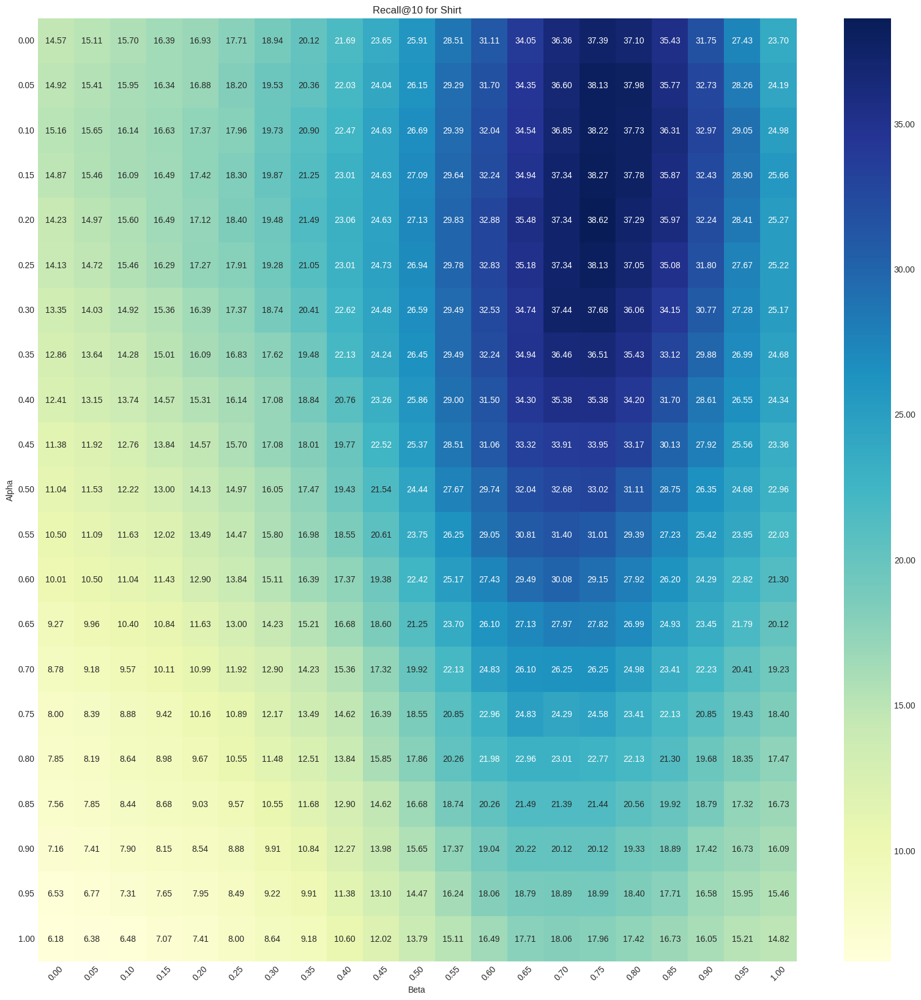

In [30]:
prepare_and_plot_recall_pivot(shirt_recall_at10, "Recall@10 for Shirt")

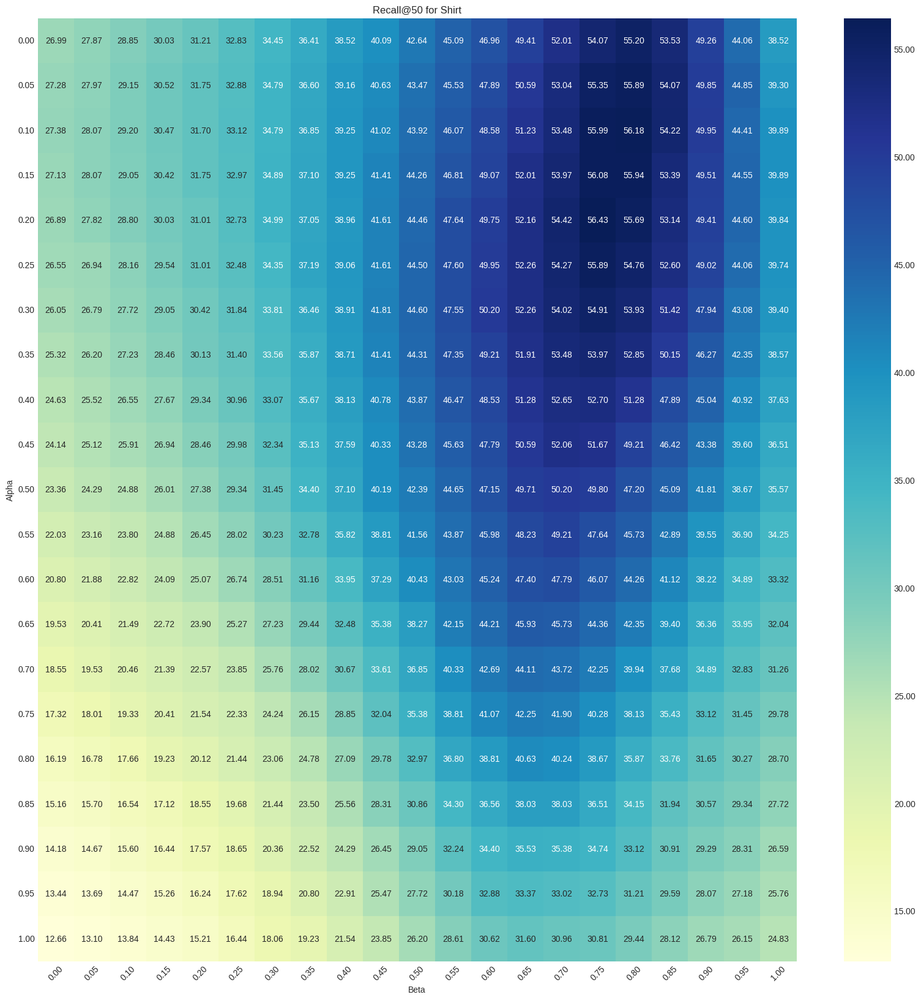

In [31]:
prepare_and_plot_recall_pivot(shirt_recall_at50, "Recall@50 for Shirt")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for Dress</div>

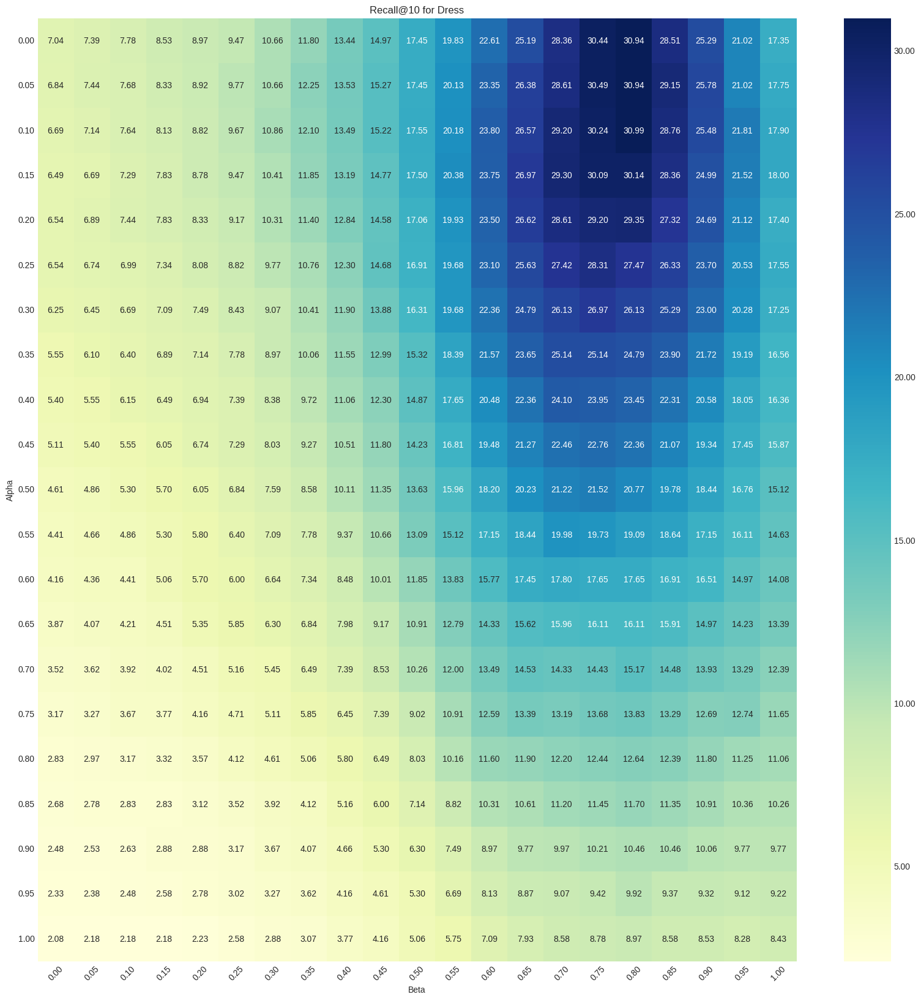

In [32]:
prepare_and_plot_recall_pivot(dress_recall_at10, "Recall@10 for Dress")

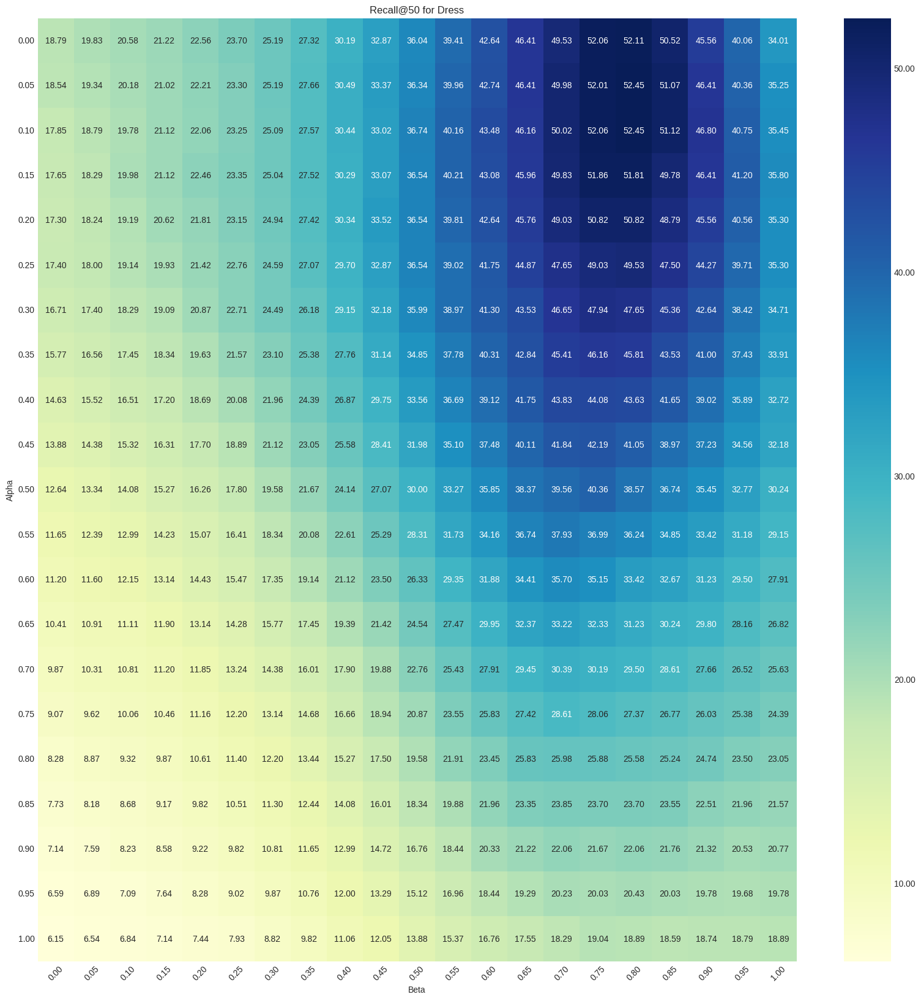

In [33]:
prepare_and_plot_recall_pivot(dress_recall_at50, "Recall@50 for Dress")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for TopTee</div>

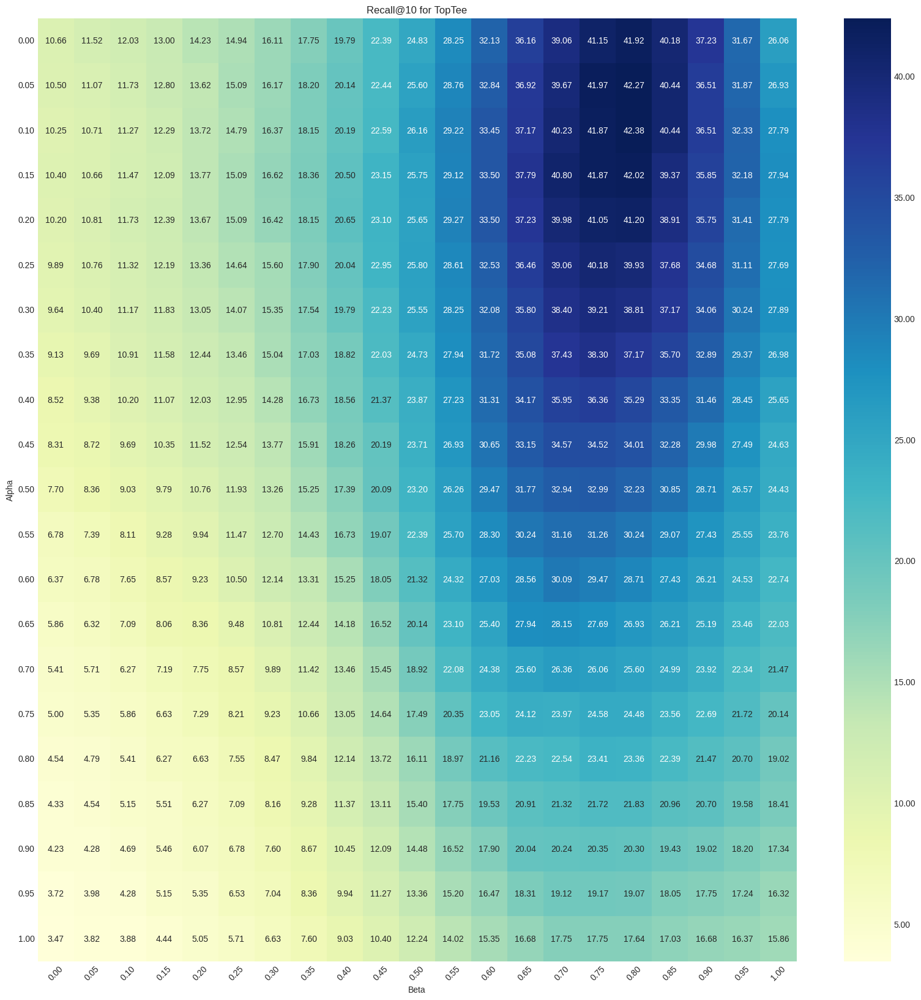

In [34]:
prepare_and_plot_recall_pivot(toptee_recall_at10, "Recall@10 for TopTee")

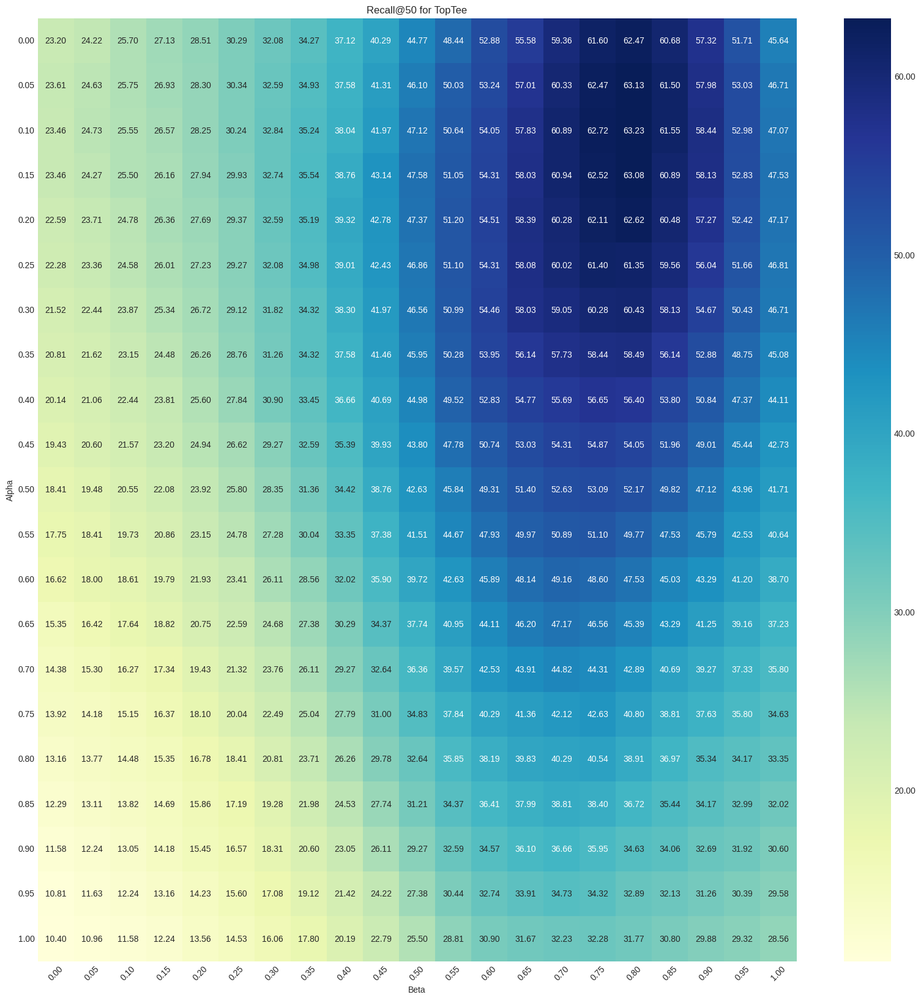

In [35]:
prepare_and_plot_recall_pivot(toptee_recall_at50, "Recall@50 for TopTee")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the average recall at 10 and 50 for all categories</div>

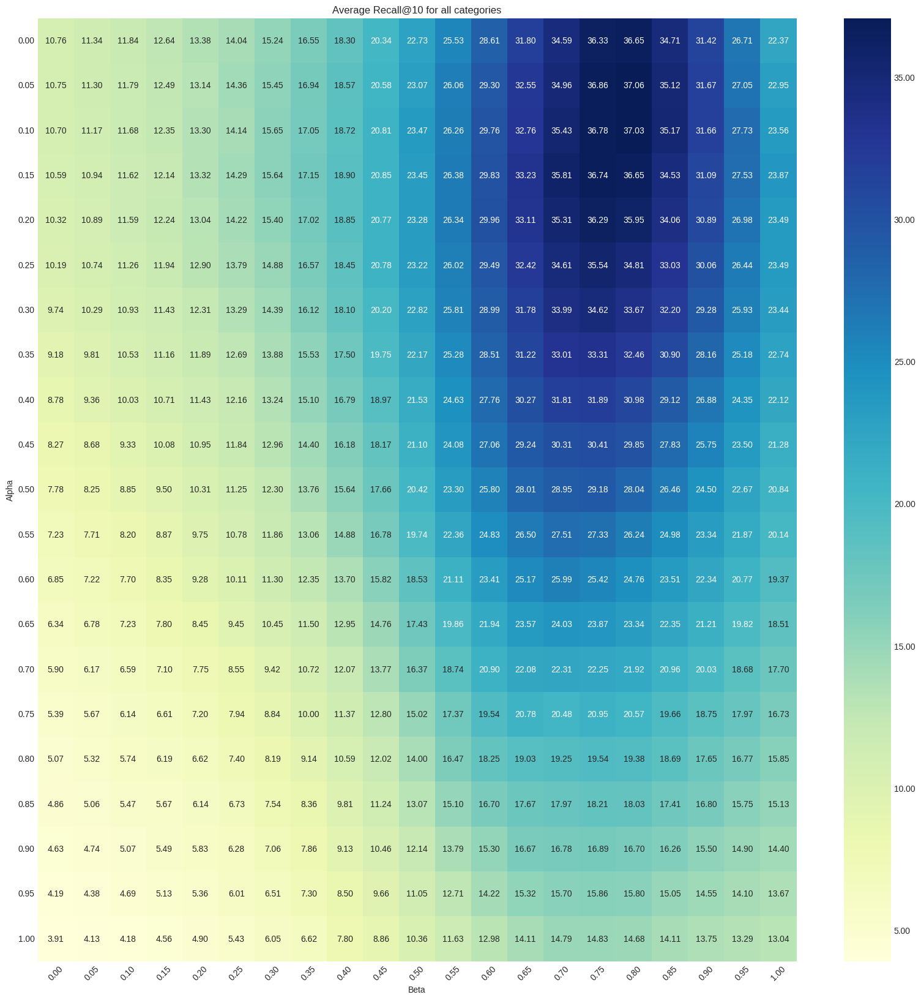

In [36]:
prepare_and_plot_recall_pivot(average_recall_at10, "Average Recall@10 for all categories")

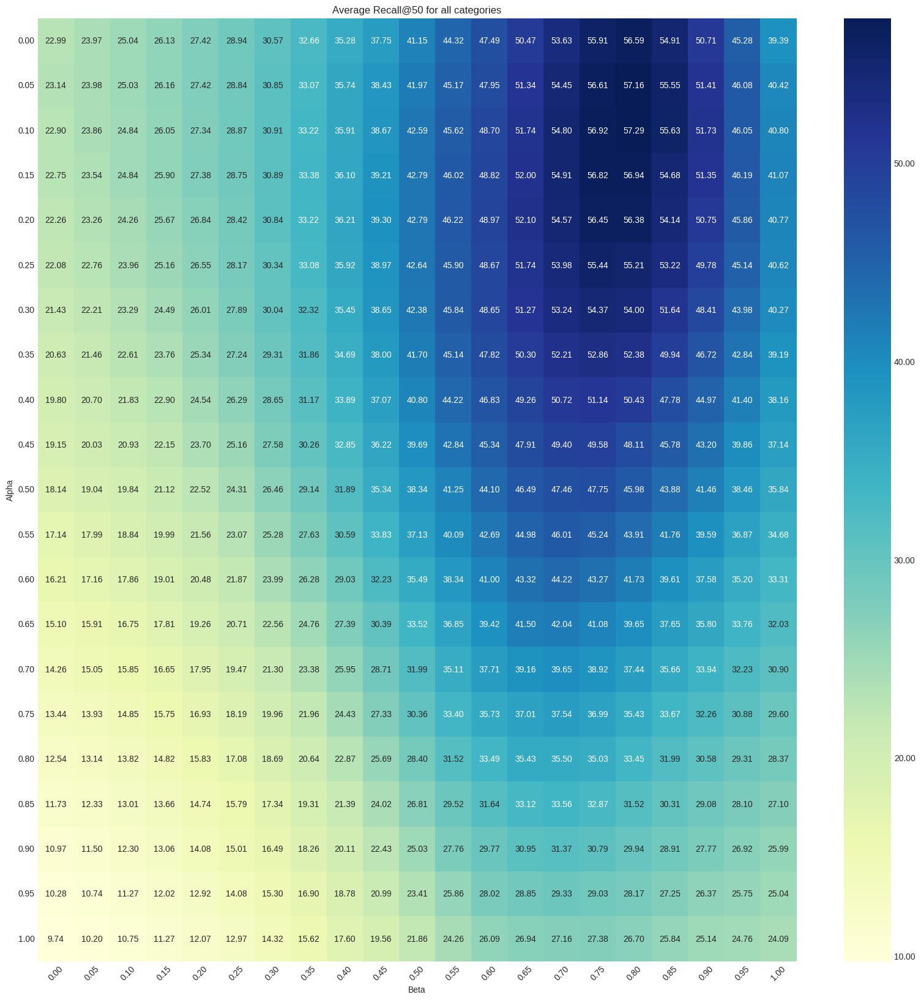

In [37]:
prepare_and_plot_recall_pivot(average_recall_at50, "Average Recall@50 for all categories")

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to compute the results</div>

In [38]:
def compute_results(
    dress_type: str,
    combining_function: callable,
    clip_text_encoder: torch.nn.Module,
    clip_img_encoder: torch.nn.Module,
    clip_tokenizer,
    text_captions: List[dict],
    preprocess: callable,
    alpha: float = 0.65
) -> Tuple[torch.tensor, List[str], List[str]]:
    """
    View sample results on FashionIQ dataset combining text and image distances.
    
    :param dress_type: FashionIQ category on which perform the retrieval
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined features
    :param clip_text_encoder: BLIP text model
    :param clip_img_encoder: BLIP image model
    :param clip_tokenizer: BLIP tokenizer
    :param text_captions: text captions for the FashionIQ dataset
    :param preprocess: preprocess pipeline
    :param alpha: alpha value for combining text and image distances
    
    :return: [(image_path, text_caption, candidate_image_paths)]
    """
    clip_text_encoder = clip_text_encoder.float().eval()
    clip_img_encoder = clip_img_encoder.float().eval()

    # Define the validation datasets and extract the index features
    classic_val_dataset = FashionIQDataset('val', [dress_type], 'classic', preprocess)

    multiple_text_index_features, multiple_text_index_names = [], []

    for i in range(3):
        index_features, index_names, _ = extract_index_features_with_text_captions_clip(
            classic_val_dataset,
            clip_text_encoder,
            clip_tokenizer,
            text_captions,
            i + 1
        )
        multiple_text_index_features.append(index_features)
        multiple_text_index_names.append(index_names)

    image_index_features, image_index_names = extract_index_features_clip(
        classic_val_dataset,
        clip_img_encoder
    )

    relative_val_dataset = FashionIQDataset('val', [dress_type], 'relative', preprocess)

    all_text_distances = []

    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_text_index_features, multiple_text_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, target_names = generate_fiq_val_predictions(
            clip_text_encoder, 
            clip_tokenizer,
            relative_val_dataset,
            combining_function, 
            text_names,
            text_features
        )
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    predicted_image_features, target_names = generate_fiq_val_predictions(
        clip_text_encoder,
        clip_tokenizer,
        relative_val_dataset,
        combining_function,
        image_index_names,
        image_index_features
    )

    # Normalize and compute distances
    image_index_features = F.normalize(image_index_features, dim=-1).float()
    image_distances = 1 - predicted_image_features @ image_index_features.T

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)

    merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances

    sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
    sorted_index_names = np.array(image_index_names if image_index_names else multiple_text_index_names[0])[
        sorted_indices]
    labels = torch.tensor(
        sorted_index_names == np.repeat(np.array(target_names),
                                        len(image_index_names if image_index_names else multiple_text_index_names[
                                            0])).reshape(len(target_names), -1))
    assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
    recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
    recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100

    print(f"Recall at 10: {recall_at10}")
    print(f"Recall at 50: {recall_at50}")

    return sorted_indices, image_index_names, target_names

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Dress category</div>

In [39]:
sorted_indices_dress, image_index_names_dress, target_names_dress = compute_results(
    'dress',
    get_combing_function_with_beta(0.8),
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0.1
)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:47<00:00,  1.89s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 10:03:35.727079] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.77it/s]


[2024-06-10 10:03:49.166714] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.72it/s]


[2024-06-10 10:04:02.735867] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.72it/s]


[2024-06-10 10:04:16.311974] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.71it/s]


Recall at 10: 30.986613035202026

Recall at 50: 52.45413780212402

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Shirt category</div>

In [40]:
sorted_indices_shirt, image_index_names_shirt, target_names_shirt = compute_results(
    'shirt',
    get_combing_function_with_beta(0.8),
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0.1
)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:17<00:00,  1.89s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-10 10:12:55.263356] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.74it/s]


[2024-06-10 10:13:08.775498] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.66it/s]


[2024-06-10 10:13:22.507925] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.64it/s]


[2024-06-10 10:13:36.314928] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.66it/s]


Recall at 10: 37.73307204246521

Recall at 50: 56.182533502578735

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the TopTee category</div>

In [41]:
sorted_indices_toptee, image_index_names_toptee, target_names_toptee = compute_results(
    'toptee',
    get_combing_function_with_beta(0.8),
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0.1
)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:14<00:00,  1.87s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 10:20:52.818783] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:14<00:00,  4.40it/s]


[2024-06-10 10:21:06.915376] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.72it/s]


[2024-06-10 10:21:20.062901] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.72it/s]


[2024-06-10 10:21:33.192096] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.65it/s]


Recall at 10: 42.37633943557739

Recall at 50: 63.233041763305664

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [42]:
def prepare_ground_truths(json_data):
    """
    Prepare ground truth data from the JSON structure.
    
    :param json_data: JSON data containing target and candidate matches with captions
    :return: Dictionary mapping targets to lists of tuples (candidates and captions)
    """
    ground_truths = {}
    for entry in json_data:
        target = entry['target']
        candidate = entry['candidate']
        captions = entry['captions']
        if target not in ground_truths:
            ground_truths[target] = []
        ground_truths[target].append((candidate, captions))  # Store as a tuple
    return ground_truths

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the retrieval results for a query</div>

In [43]:
def plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truths, top_k=5, i=0):
    """
    Plot retrieval results for a specific query showing the query and its top retrieved images, highlighting ground truths
    and displaying associated captions to the left of the query image.

    :param sorted_indices: 2D tensor or array with sorted indices of retrieved images per query.
    :param image_index_names: List of image paths corresponding to indices in sorted_indices.
    :param target_names: List of names or descriptions for each query.
    :param ground_truths: Dictionary mapping target names to lists of tuples (candidates and captions).
    :param top_k: Number of top retrieved results to display per query.
    :param i: Index of the query to display.
    """
    query_index = i
    retrival_result_images = [image_index_names[j] for j in sorted_indices[query_index]][:top_k]
    ground_truth_target = target_names[query_index]
    query_img_path, query_captions = ground_truths.get(ground_truth_target, [('', '')])[0]

    fig = plt.figure(figsize=(30, 5))
    gs = GridSpec(1, top_k + 2, figure=fig)
    query_img = Image.open(f'../fashionIQ_dataset/images/{query_img_path}.png')

    # Subplot for the caption text to the left of the query image
    ax_text = fig.add_subplot(gs[0, 0])
    query_name = query_img_path
    query_captions = '\n'.join(sentences for sentences in query_captions)
    ax_text.text(0.5, 0.5, query_captions, va='center', ha='center')
    ax_text.axis('off')

    # Subplot for the query image
    ax_image = fig.add_subplot(gs[0, 1])
    ax_image.imshow(query_img)
    ax_image.set_title(f"Query: {query_name}", color='blue')
    ax_image.axis('off')

    for j, img_path in enumerate(retrival_result_images):
        img = Image.open(f'../fashionIQ_dataset/images/{img_path}.png')

        ax_result = fig.add_subplot(gs[0, j + 2])
        ax_result.imshow(img)

        # Check if this image is a ground truth and retrieve its captions
        if img_path == ground_truth_target:
            ax_result.set_title(f"{img_path}", color='green')
        else:
            ax_result.set_title(img_path)

        ax_result.axis('off')

    plt.tight_layout()
    plt.show()

In [44]:
ground_truth_dress = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.dress.val.json')))
ground_truth_shirt = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.shirt.val.json')))
ground_truth_toptee = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.toptee.val.json')))

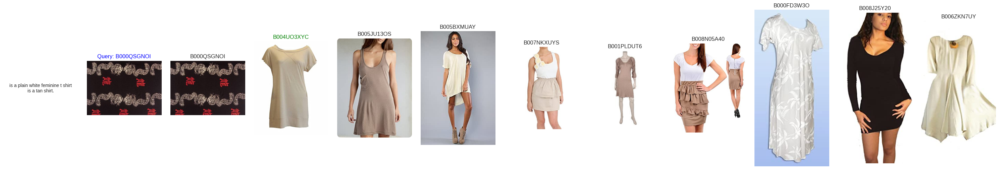

In [45]:
plot_retrieval_results_of_i(sorted_indices_dress, image_index_names_dress, target_names_dress, ground_truth_dress, top_k=10, i=3)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with alpha=0, and without weighted merge beta</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Dress category with alpha=0 and without weighted merge beta</div>

In [46]:
sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin = compute_results(
    'dress',
    combining_function_original,
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [03:47<00:00,  1.90s/it]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-10 10:27:01.218044] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.75it/s]


[2024-06-10 10:27:14.699498] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.69it/s]


[2024-06-10 10:27:28.350726] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.69it/s]


[2024-06-10 10:27:41.995473] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.70it/s]


Recall at 10: 17.451660335063934

Recall at 50: 36.04362905025482

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Shirt category with alpha=0 and without weighted merge beta</div>

In [47]:
sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin = compute_results(
    'shirt',
    combining_function_original,
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [06:16<00:00,  1.89s/it]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-10 10:36:21.261229] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.75it/s]


[2024-06-10 10:36:34.747461] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.66it/s]


[2024-06-10 10:36:48.479348] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.67it/s]


[2024-06-10 10:37:02.205057] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:13<00:00,  4.67it/s]


Recall at 10: 25.90775191783905

Recall at 50: 42.63984262943268

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the TopTee category with alpha=0 and without weighted merge beta</div>

In [48]:
sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin = compute_results(
    'toptee',
    combining_function_original,
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [05:18<00:00,  1.89s/it]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-10 10:44:22.964614] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:14<00:00,  4.39it/s]


[2024-06-10 10:44:37.085259] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.71it/s]


[2024-06-10 10:44:50.250438] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.72it/s]


[2024-06-10 10:45:03.393588] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:13<00:00,  4.71it/s]


Recall at 10: 24.834267795085907

Recall at 50: 44.773074984550476

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [49]:
def found_better_than_original(
        sorted_indices_origin, image_index_names_origin, target_names_origin,
        sorted_indices, image_index_names, target_names, top_k=10
) -> List[int]:
    """
    Return indices of queries where the new retrieval results are better than the original results based on the rank
    of the ground truth in the top_k results.

    Args:
        sorted_indices_origin (np.ndarray): 2D array of sorted indices by relevance per query for the original method.
        image_index_names_origin (List[str]): List of image names corresponding to indices in sorted_indices_origin.
        target_names_origin (List[str]): List of names or descriptions for each query for the original method.
        sorted_indices (np.ndarray): 2D array of sorted indices by relevance per query for the new method.
        image_index_names (List[str]): List of image names corresponding to indices in sorted_indices.
        target_names (List[str]): List of target names each query is supposed to retrieve.
        top_k (int): Number of top retrieved results to consider per query.

    Returns:
        List[int]: List of indices where the new method outperforms the original method in terms of the rank of the
        ground truth target.
    """
    better_indices = []
    total_queries = len(target_names)  # Assuming the same number of queries for both sets

    for index in range(total_queries):
        # Find the index of the ground truth in the top_k results of the original method
        new_rank = [image_index_names[i] for i in sorted_indices[index]].index(target_names[index])
        origin_rank = [image_index_names_origin[i] for i in sorted_indices_origin[index]].index(target_names_origin[index])

        if new_rank <= top_k < origin_rank:
            better_indices.append(index)

    return better_indices

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Dress category</div>

In [50]:
become_better = found_better_than_original(
    sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin,
    sorted_indices_dress, image_index_names_dress, target_names_dress,
    top_k=10
)

len(become_better), become_better[:10]

(337, [0, 1, 3, 12, 16, 26, 32, 38, 40, 43])

In [51]:
become_worse = found_better_than_original(
    sorted_indices_dress, image_index_names_dress, target_names_dress,
    sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(69, [23, 114, 126, 159, 176, 215, 298, 340, 345, 378])

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Shirt category</div>

In [52]:
become_better = found_better_than_original(
    sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin,
    sorted_indices_shirt, image_index_names_shirt, target_names_shirt,
    top_k=10
)

len(become_better), become_better[:10]

(335, [13, 16, 20, 21, 26, 34, 40, 45, 49, 50])

In [53]:
become_worse = found_better_than_original(
    sorted_indices_shirt, image_index_names_shirt, target_names_shirt,
    sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(87, [10, 75, 123, 222, 258, 276, 281, 287, 289, 376])

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the TopTee category</div>

In [54]:
become_better = found_better_than_original(
    sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin,
    sorted_indices_toptee, image_index_names_toptee, target_names_toptee,
    top_k=10
)

len(become_better), become_better[:10]

(429, [7, 9, 10, 15, 16, 17, 20, 21, 25, 26])

In [55]:
become_worse = found_better_than_original(
    sorted_indices_toptee, image_index_names_toptee, target_names_toptee,
    sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(76, [35, 57, 101, 112, 216, 238, 263, 342, 398, 403])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the Dress category</div>

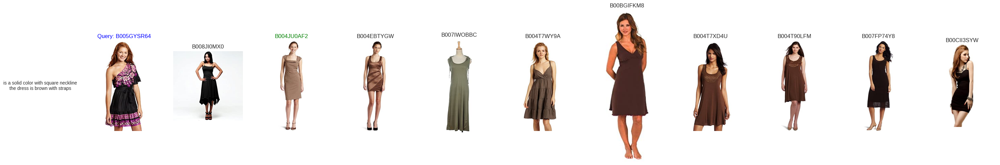

In [58]:
plot_retrieval_results_of_i(sorted_indices_dress, image_index_names_dress, target_names_dress, ground_truth_dress, top_k=10, i=16)

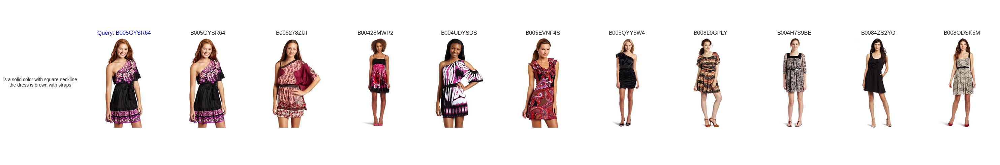

In [59]:
plot_retrieval_results_of_i(sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin, ground_truth_dress, top_k=10, i=16)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the Shirt category</div>

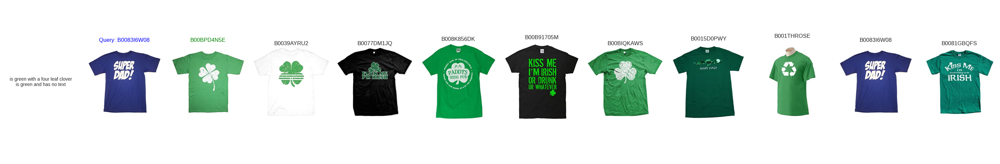

In [60]:
plot_retrieval_results_of_i(sorted_indices_shirt, image_index_names_shirt, target_names_shirt, ground_truth_shirt, top_k=10, i=1)

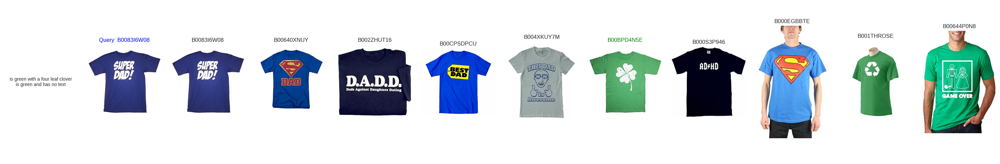

In [61]:
plot_retrieval_results_of_i(sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin, ground_truth_shirt, top_k=10, i=1)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the TopTee category</div>

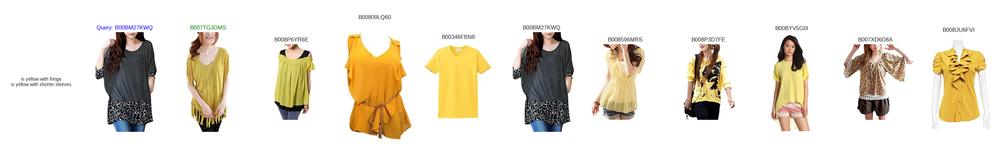

In [62]:
plot_retrieval_results_of_i(sorted_indices_toptee, image_index_names_toptee, target_names_toptee, ground_truth_toptee, top_k=10, i=2)

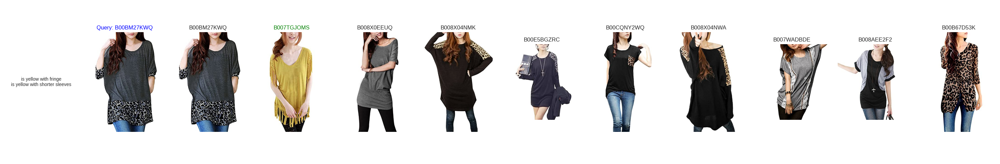

In [63]:
plot_retrieval_results_of_i(sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin, ground_truth_toptee, top_k=10, i=2)